# Initiez-vous au MLOps (partie 1/2)
## Option B - Exercice - Élaborez un modèle de scoring

Vous êtes Data Scientist au sein d'une société financière, nommée "Prêt à dépenser", qui propose des crédits à la consommation pour des personnes ayant peu ou pas du tout d'historique de prêt.
 
L’entreprise souhaite mettre en œuvre un outil de “scoring crédit” pour calculer la probabilité qu’un client rembourse son crédit, puis classifie la demande en crédit accordé ou refusé. Elle souhaite donc développer un algorithme de classification en s’appuyant sur des sources de données variées (données comportementales, données provenant d'autres institutions financières, etc.)

La mission :
- Construire et optimiser un modèle de scoring qui donnera une prédiction sur la probabilité de faillite d'un client de façon automatique.
- Analyser les features qui contribuent le plus au modèle, d’une manière générale (feature importance globale) et au niveau d’un client (feature importance locale), afin, dans un soucis de transparence, de permettre à un chargé d’études de mieux comprendre le score attribué par le modèle.
- Mettre en œuvre une approche globale MLOps de bout en bout, du tracking des expérimentations à la pré-production du modèle.

Mise en oeuvre des étapes orientées MLOps suivantes :
- Dans le notebook d’entraînement des modèles, générer à l’aide de MLFlow un tracking d'expérimentations.
- Lancer l’interface web “UI MLFlow" d'affichage des résultats du tracking.
- Réaliser avec MLFlow un stockage centralisé des modèles dans un “model registry”.
- Tester le serving MLFlow.

### Objectif de cette étape :
* Comprendre l'ensemble des dataset.
* Comprendre notre variable cible et quelques variables clés.
* Identifier les potentiels outliers et erreurs de format.
* Préparation dans le dossier src des scripts afin de nettoyer proprement les données et de pouvoir les fusionner lors du prochain notebook.

* Comme indiqué dans l'énoncé, pour la réalisation de ces éléments, notamment de la façon de traiter les informations :
   * https://www.kaggle.com/code/willkoehrsen/start-here-a-gentle-introduction/notebook

## Importation des librairies

In [1]:
# Librairies de base
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Visualisation des valeurs manquantes
import missingno as msno

# Meilleure visualisation des grands df
import itables.options as opt
from itables import show

Activation de l’affichage interactif automatiquement dans les notebooks


In [2]:
opt.warn_on_undocumented_option = False
opt.notebook_connected = True
opt.maxBytes = 0 # Pour ne pas tronquer les gros DataFrames
opt.maxColumns = 0

### Étape 1 - Préparez, nettoyez et enrichissez les données

#### Charger chaque fichier séparément et inspecter ses colonnes

#### 1) Importation du fichier application_test.csv :
* This is the main table, broken into two files for Train (with TARGET) and Test (without TARGET).
* Static data for all applications. One row represents one loan in our data sample.

In [3]:
app_test = pd.read_csv("../data/raw/application_test.csv")

##### On vérifie la bonne importation

In [4]:
show(app_test.head(1000))

Loading ITables v2.5.2 from the internet... (need help?)


##### Effectivement la target ne se retrouve pas dans de fichier.

Nombre de lignes et de colonnes

In [5]:
shape_test = app_test.shape
print(f"Nous avons ici {app_test.shape[0]} lignes et {app_test.shape[1]} colonnes.")

Nous avons ici 48744 lignes et 121 colonnes.


##### Vérification des doublons
* Au global

In [6]:
app_test.duplicated(keep = False).any()

np.False_

* Par ID au cas où

In [7]:
app_test.duplicated(['SK_ID_CURR'],keep = False).any()

np.False_

* Nous n'avons pas de doublons dans notre fichier test.
* Nous avons bien une ligne par client.

##### Vérification des valeurs manquantes

In [8]:
missed_val_apptest = app_test.isnull().mean()
missed_val_apptest = missed_val_apptest[missed_val_apptest > 0].count()
print(f"Nous avons {missed_val_apptest} colonnes avec des valeurs manquantes.")

Nous avons 64 colonnes avec des valeurs manquantes.


* Regardons les colonnes avec les taux les plus élevés.

In [9]:
missed_val_apptest = app_test.isnull().mean()
missed_val_apptest = missed_val_apptest[missed_val_apptest >= 0.60]
missed_val_apptest

OWN_CAR_AGE                 0.662892
YEARS_BUILD_AVG             0.652757
COMMONAREA_AVG              0.687161
FLOORSMIN_AVG               0.666051
LIVINGAPARTMENTS_AVG        0.672493
NONLIVINGAPARTMENTS_AVG     0.684125
YEARS_BUILD_MODE            0.652757
COMMONAREA_MODE             0.687161
FLOORSMIN_MODE              0.666051
LIVINGAPARTMENTS_MODE       0.672493
NONLIVINGAPARTMENTS_MODE    0.684125
YEARS_BUILD_MEDI            0.652757
COMMONAREA_MEDI             0.687161
FLOORSMIN_MEDI              0.666051
LIVINGAPARTMENTS_MEDI       0.672493
NONLIVINGAPARTMENTS_MEDI    0.684125
FONDKAPREMONT_MODE          0.672842
dtype: float64

* Il est important de constaster que nous avons plusieurs colonnes avec des valeurs manquantes. Le seuil "critique" des 80-85% de données manquantes n'est pas dépassé, nous verrons la gestion des ces colonnes un peu plus tard.

##### Les statistiques descriptives

In [10]:
show(app_test.describe())

Loading ITables v2.5.2 from the internet... (need help?)


##### On remarques plusieurs choses intéressantes :
* Nous devons changer le format des dates pour DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH
* A regarder la colonne CNT_CHILDREN avec le max qui est de 20.
* Pour FLAG_DOCUMENT_2, FLAG_DOCUMENT_10, FLAG_DOCUMENT_12, FLAG_DOCUMENT_13, FLAG_DOCUMENT_14, FLAG_DOCUMENT_15, FLAG_DOCUMENT_16, FLAG_DOCUMENT_17,
FLAG_DOCUMENT_19, FLAG_DOCUMENT_20, FLAG_DOCUMENT_21 --> pas de données dans ces colonnes, à vérifier dans app_train.
* Il y a des montants qui semblent énorme dans les revenus par clients avec un max à 44 100 000 euros. nous regarderons ça aussi dans l'app_train.

#### Vérification pour CNT_CHILDREN

In [11]:
app_test['CNT_CHILDREN'].value_counts()

CNT_CHILDREN
0     34685
1      9504
2      3949
3       535
4        49
5        12
8         3
6         3
11        2
7         1
20        1
Name: count, dtype: int64

On voit que le fait d'avoir 20 enfants arrive qu'une seule fois, c'est possible. Pas d'outliers ici.

##### La plupart des dates sont justes à transformer en année pour être plus lisibles (actuellement en format jour), à part pour DAYS_EMPLOYED où on retrouve une anomalie.
* On retrouve des lignes avec un max de 365243 jours soit 1000 ans. Regardons ça de plus près.

In [12]:
show(app_test.loc[app_test['DAYS_EMPLOYED']==365243])

Loading ITables v2.5.2 from the internet... (need help?)


* On a un total de 9 274 lignes, ce qui est très important et montre que cela ne relève pas d'une erreur mais d'un code source pour indiquer quelque chose, que la donnée n'est pas connue.
* La méthode ici sera de transformer cette valeur en np.nan afin d'y appliquer une imputation après la fusion des fichiers. Nous commençons à remplir la fonction dans src/data_cleaning.py

##### Types de données différents

* Par type

In [13]:
app_test.dtypes.value_counts()

float64    65
int64      40
object     16
Name: count, dtype: int64

* Nombre de valeurs différentes par colonnes en "object"

In [14]:
app_test.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    2
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               7
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             5
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

##### On fait apparaître les valeurs afin de pouvoir corriger les formats ou les erreurs manuelles.

In [15]:
for col in app_test.select_dtypes('object').columns:
    print(f"\n{col} :")
    print(app_test[col].unique())


NAME_CONTRACT_TYPE :
['Cash loans' 'Revolving loans']

CODE_GENDER :
['F' 'M']

FLAG_OWN_CAR :
['N' 'Y']

FLAG_OWN_REALTY :
['Y' 'N']

NAME_TYPE_SUITE :
['Unaccompanied' nan 'Family' 'Spouse, partner' 'Group of people'
 'Other_B' 'Children' 'Other_A']

NAME_INCOME_TYPE :
['Working' 'State servant' 'Pensioner' 'Commercial associate'
 'Businessman' 'Student' 'Unemployed']

NAME_EDUCATION_TYPE :
['Higher education' 'Secondary / secondary special' 'Incomplete higher'
 'Lower secondary' 'Academic degree']

NAME_FAMILY_STATUS :
['Married' 'Single / not married' 'Civil marriage' 'Widow' 'Separated']

NAME_HOUSING_TYPE :
['House / apartment' 'With parents' 'Rented apartment'
 'Municipal apartment' 'Office apartment' 'Co-op apartment']

OCCUPATION_TYPE :
[nan 'Low-skill Laborers' 'Drivers' 'Sales staff' 'High skill tech staff'
 'Core staff' 'Laborers' 'Managers' 'Accountants' 'Medicine staff'
 'Security staff' 'Private service staff' 'Secretaries' 'Cleaning staff'
 'Cooking staff' 'HR staff' '

* Cela permet à l'identification d'une partie des variables catégorielles.
* Egalement cela va nous permettre de voir si les formats sont ok ou non.


##### Vérifications :
* NAME_CONTRACT_TYPE : à modifier les espaces par _
* CODE_GENDER / FLAG_OWN_CAR / FLAG_OWN_REALTY : OK
* NAME_TYPE_SUITE : à modifier les epsaces et vérifications de certains noms
* NAME_INCOME_TYPE : à modifier les espaces par _
* NAME_EDUCATION_TYPE / NAME_FAMILY_STATUS / NAME_HOUSING_TYPE / OCCUPATION_TYPE : à modifier les espaces par _ et à gérer les "/" sauf pour OCCUPATION_TYPE
* WEEKDAY_APPR_PROCESS_START : OK
* ORGANIZATION_TYPE : à modifier les espaces par _ et enlever les ":"
* FONDKAPREMONT_MODE / HOUSETYPE_MODE / WALLSMATERIAL_MODE : à modifier les espaces par _
* EMERGENCYSTATE_MODE : transformer les nan et No en N et les Yes en Y

##### Transformation des dates en année & nettoyage des formats des variables qualitatives dans une fonction qui se trouve dans src/data_cleaning.py afin d'être réutilisable pour le fichier application_train.
* Jour en année en divisant par 365
* Subtilité pour DAYS_EMPLOYED car nous transformerons 365243 en np.nan afin de les identifier par la suite.
* Transformation des espaces en _ pour les valeurs non numériques

#### La clé de jointure est le SK_ID_CURR ici

#### 2) Importation du fichier application_train.csv :
* This is the main table, broken into two files for Train (with TARGET) and Test (without TARGET).
* Static data for all applications. One row represents one loan in our data sample.

In [16]:
app_train = pd.read_csv("../data/raw/application_train.csv")

##### Vérification de l'importation

In [17]:
show(app_train.head(1000))

Loading ITables v2.5.2 from the internet... (need help?)


##### Nombre de lignes et de colonnes

In [18]:
shape_test = app_train.shape
print(f"Nous avons ici {app_train.shape[0]} lignes et {app_train.shape[1]} colonnes.")

Nous avons ici 307511 lignes et 122 colonnes.


##### Nous avons une colonne de plus que dans test, ce qui est normal car nous avons la variable cible dans ce fichier.

##### Vérification des doublons

* Au global

In [19]:
app_train.duplicated(keep = False).any()

np.False_

* Par ID au cas où

In [20]:
app_train.duplicated(['SK_ID_CURR'],keep = False).any()

np.False_

##### Vérification des valeurs manquantes

In [21]:
missed_val_apptrain = app_train.isnull().mean()
missed_val_apptrain = missed_val_apptrain[missed_val_apptrain > 0].count()
print(f"Nous avons {missed_val_apptrain} colonnes avec des valeurs manquantes.")

Nous avons 67 colonnes avec des valeurs manquantes.


* Regardons les colonnes avec les taux les plus élevés.

In [22]:
missed_val_apptrain = app_train.isnull().mean()
missed_val_apptrain = missed_val_apptrain[missed_val_apptrain >= 0.60]
missed_val_apptrain

OWN_CAR_AGE                 0.659908
YEARS_BUILD_AVG             0.664978
COMMONAREA_AVG              0.698723
FLOORSMIN_AVG               0.678486
LIVINGAPARTMENTS_AVG        0.683550
NONLIVINGAPARTMENTS_AVG     0.694330
YEARS_BUILD_MODE            0.664978
COMMONAREA_MODE             0.698723
FLOORSMIN_MODE              0.678486
LIVINGAPARTMENTS_MODE       0.683550
NONLIVINGAPARTMENTS_MODE    0.694330
YEARS_BUILD_MEDI            0.664978
COMMONAREA_MEDI             0.698723
FLOORSMIN_MEDI              0.678486
LIVINGAPARTMENTS_MEDI       0.683550
NONLIVINGAPARTMENTS_MEDI    0.694330
FONDKAPREMONT_MODE          0.683862
dtype: float64

* Il est important de constaster que nous avons plusieurs colonnes avec des valeurs manquantes. Le seuil "critique" des 80-85% de données manquantes n'est pas dépassé, nous verrons la gestion des ces colonnes un peu plus tard.

Regardons la matrice msno afin de se rendre compte des valeurs manquantes par colonne.

<Axes: >

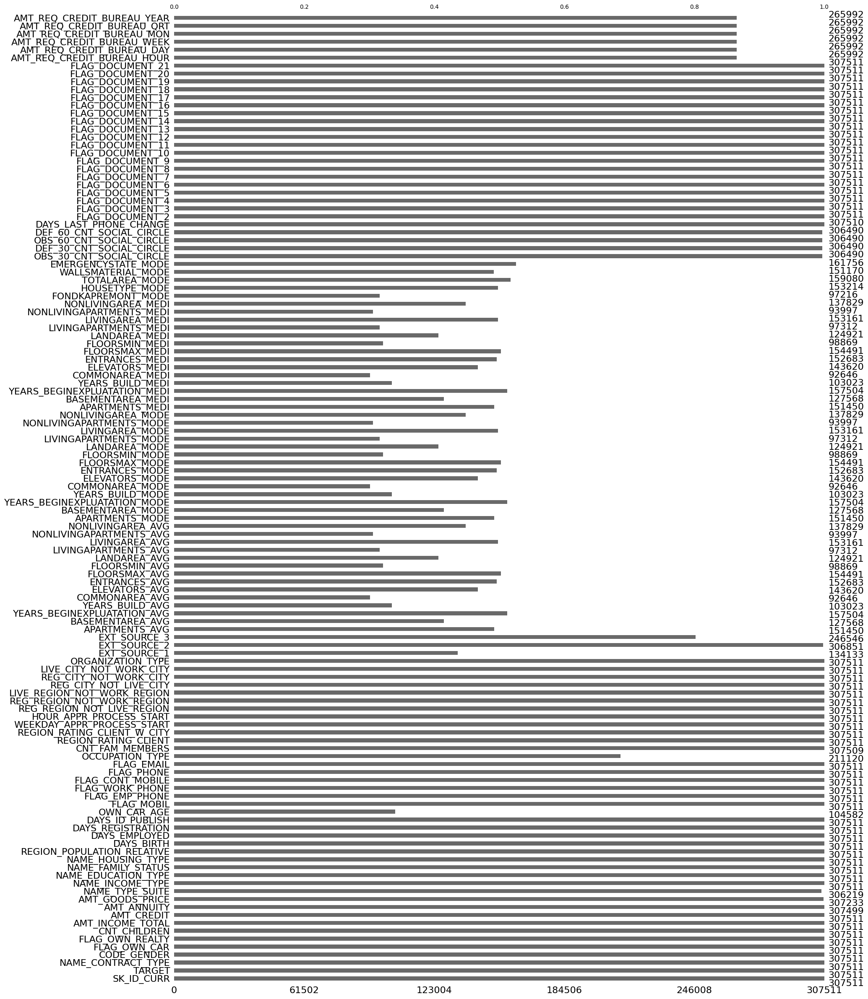

In [23]:
msno.bar(app_train, figsize=(20, 30))

##### Les statistiques descriptives

In [24]:
show(app_train.describe())

Loading ITables v2.5.2 from the internet... (need help?)


##### Récapitulatif
* Sans être étonné, nous retrouvons les mêmes "problèmes" que dans l'application_test.
* Pour FLAG_DOCUMENT_2, FLAG_DOCUMENT_10, FLAG_DOCUMENT_12, FLAG_DOCUMENT_13, FLAG_DOCUMENT_14, FLAG_DOCUMENT_15, FLAG_DOCUMENT_16, FLAG_DOCUMENT_17,
FLAG_DOCUMENT_19, FLAG_DOCUMENT_20, FLAG_DOCUMENT_21 --> Ici, on retrouve des informations, contrairement à dans l'application_test.
* Certain revenus sont très élevés également ici.

##### On retrouve plusieurs revenus très très élevé, mais difficle de savoir si c'est possible ou pas, nous devons donc les garder.
* On peut en visualiser ci de-dessous.

In [25]:
show(app_train.nlargest(300, 'AMT_INCOME_TOTAL'))

Loading ITables v2.5.2 from the internet... (need help?)


##### Type de données différentes

In [26]:
app_train.dtypes.value_counts()

float64    65
int64      41
object     16
Name: count, dtype: int64

* Nombre de valeurs différentes par colonnes en "object"

In [27]:
app_train.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

##### Analysons ces variables catégorielles de plus près

In [28]:
for col in app_train.select_dtypes('object').columns:
    print(f"\n{col} :")
    print(app_train[col].unique())


NAME_CONTRACT_TYPE :
['Cash loans' 'Revolving loans']

CODE_GENDER :
['M' 'F' 'XNA']

FLAG_OWN_CAR :
['N' 'Y']

FLAG_OWN_REALTY :
['Y' 'N']

NAME_TYPE_SUITE :
['Unaccompanied' 'Family' 'Spouse, partner' 'Children' 'Other_A' nan
 'Other_B' 'Group of people']

NAME_INCOME_TYPE :
['Working' 'State servant' 'Commercial associate' 'Pensioner' 'Unemployed'
 'Student' 'Businessman' 'Maternity leave']

NAME_EDUCATION_TYPE :
['Secondary / secondary special' 'Higher education' 'Incomplete higher'
 'Lower secondary' 'Academic degree']

NAME_FAMILY_STATUS :
['Single / not married' 'Married' 'Civil marriage' 'Widow' 'Separated'
 'Unknown']

NAME_HOUSING_TYPE :
['House / apartment' 'Rented apartment' 'With parents'
 'Municipal apartment' 'Office apartment' 'Co-op apartment']

OCCUPATION_TYPE :
['Laborers' 'Core staff' 'Accountants' 'Managers' nan 'Drivers'
 'Sales staff' 'Cleaning staff' 'Cooking staff' 'Private service staff'
 'Medicine staff' 'Security staff' 'High skill tech staff'
 'Waiters/bar

##### Vérifications :
* NAME_CONTRACT_TYPE : à modifier les espaces par _
* CODE_GENDER / FLAG_OWN_CAR / FLAG_OWN_REALTY : OK
* NAME_TYPE_SUITE : à modifier les epsaces et vérifications de certains noms
* NAME_INCOME_TYPE : à modifier les espaces par _
* NAME_EDUCATION_TYPE / NAME_FAMILY_STATUS / NAME_HOUSING_TYPE / OCCUPATION_TYPE : à modifier les espaces par _ et à gérer les "/" sauf pour OCCUPATION_TYPE
* WEEKDAY_APPR_PROCESS_START : OK
* ORGANIZATION_TYPE : à modifier les espaces par _ et enlever les ":"
* FONDKAPREMONT_MODE / HOUSETYPE_MODE / WALLSMATERIAL_MODE : à modifier les espaces par _
* EMERGENCYSTATE_MODE : transformer les nan et No en N et les Yes en Y
* En + nous avons à gérer le XNA dans CODE_GENRE, on ne sait pas ce que c'est, cela correspond à 4 lignes donc nous pourrons les supprimer.

##### Analyse de notre variable cible :
* % de valeurs par classe

In [29]:
round(app_train['TARGET'].value_counts(normalize=True),2)

TARGET
0    0.92
1    0.08
Name: proportion, dtype: float64

##### Graphique de notre cible

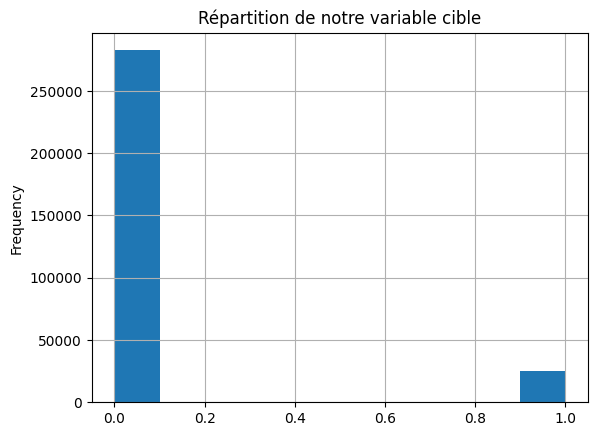

In [30]:
app_train['TARGET'].plot.hist()
plt.title("Répartition de notre variable cible")
plt.grid()

* Avec ces deux exemples on voit un net déséquilibre de notre jeu de données. Il y a + de gens qui remboursent le prêt que l'inverse.
* Bien l'avoir en tête lors de la construction de notre modèle de classification.

##### Petite analyse de la variable âge avec notre target

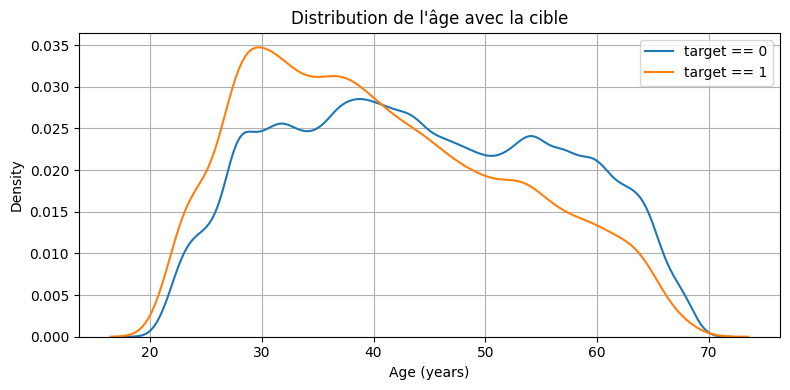

In [31]:
plt.figure(figsize = (8, 4))

# KDE plot of loans that were repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 0, 'DAYS_BIRTH'] / -365, label = 'target == 0')

# KDE plot of loans which were not repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 1, 'DAYS_BIRTH'] / -365 , label = 'target == 1')

# Labeling of plot
plt.xlabel('Age (years)')
plt.ylabel('Density')
plt.title("Distribution de l'âge avec la cible")
plt.legend(loc='upper right')
plt.grid()
plt.tight_layout()

* On voit que ceux qui ont des difficultés à rembourser leurs prêts se situent dans la trentaine.
* On voit un nombre élevé de personnes ayant remboursé sont prêt entre 30 et 45 ans environ.

##### Relation entre le genre et la cible

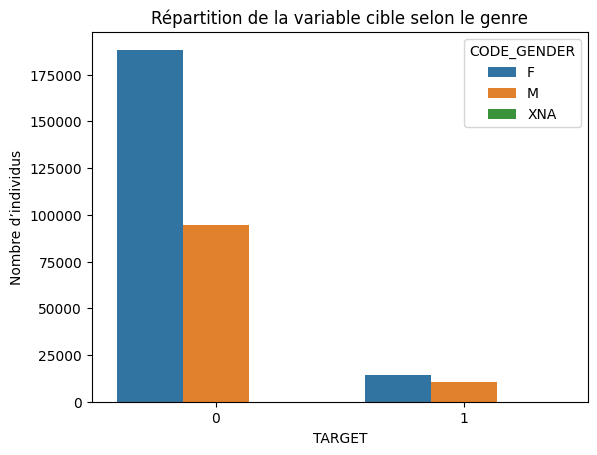

In [32]:
sns.countplot(data=app_train, x='TARGET', hue='CODE_GENDER')
plt.title("Répartition de la variable cible selon le genre")
plt.xlabel("TARGET")
plt.ylabel("Nombre d’individus")
plt.show()

* Nous avons la présence de plus de femme dans le dataset, ce qui implique plus de femmes remboursent leur prêt mais aussi plus de femmes qui ne le remborusent pas à temps.

##### Autres relations avec notre variable
* Avec NAME_CONTRACT_TYPE

In [33]:
round(pd.crosstab(app_train.TARGET, app_train.NAME_CONTRACT_TYPE, dropna=False, normalize='all'),2)

NAME_CONTRACT_TYPE,Cash loans,Revolving loans
TARGET,,
0,0.83,0.09
1,0.08,0.01


Analyse de la target en fonction du type de contrat :

* Il existe 2 types de contrat :
* cash loans,
* revolving loans.
La grande majorité des contrats (environ 83%) sont de type cash loans

* Avec FLAG_OWN_REALTY

In [34]:
round(pd.crosstab(app_train.TARGET, app_train.FLAG_OWN_REALTY, dropna=False, normalize='all'),2)

FLAG_OWN_REALTY,N,Y
TARGET,,
0,0.28,0.64
1,0.03,0.06


Analyse de la target en fonction de si le client est propriétaire ou non :

* 70 % des clients demandant un crédit sont propriétaires.

#### Avec le revenu des demandeurs

In [35]:
round(app_train.groupby(['NAME_INCOME_TYPE']).agg({'AMT_INCOME_TOTAL': ['mean', 'median', 'count']}),2)

AMT_INCOME_TOTAL                  
                                 mean    median   count
NAME_INCOME_TYPE                                       
Businessman                 652500.00  495000.0      10
Commercial associate        202955.33  180000.0   71617
Maternity leave             140400.00   90000.0       5
Pensioner                   136401.29  117000.0   55362
State servant               179737.97  157500.0   21703
Student                     170500.00  157500.0      18
Unemployed                  110536.36   78750.0      22
Working                     163169.89  135000.0  158774

* On voit qu'une grosse partie des demandes proviennent des actifs, "working".

#### Avec le type d'éducation et le nom de leur revenu principal

In [36]:
round(app_train.groupby(['NAME_EDUCATION_TYPE', 'NAME_INCOME_TYPE']).agg({'AMT_INCOME_TOTAL': ['mean', 'median', 'count', 'max']}),2)

AMT_INCOME_TOTAL  \
                                                               mean   
NAME_EDUCATION_TYPE           NAME_INCOME_TYPE                        
Academic degree               Commercial associate        274688.37   
                              Pensioner                   203919.23   
                              State servant               258847.83   
                              Working                     226312.50   
Higher education              Businessman                 652500.00   
                              Commercial associate        242284.00   
                              Maternity leave             195000.00   
                              Pensioner                   171455.11   
                              State servant               207116.16   
                              Student                     231000.00   
                              Unemployed                  189000.00   
                              Working                     194013.11   
Incomplete higher             Commercial associate        206232.30   
                              Pensioner                   149437.16   
                              State servant               173589.99   
                              Student                     157500.00   
                              Unemployed                  126000.00   
                              Working                     170659.49   
Lower secondary               Commercial associate        168173.63   
                              Pensioner                   106468.01   
                              State servant               143250.00   
                              Working                     140070.65   
Secondary / secondary special Commercial associate        181368.70   
                              Maternity leave              58500.00   
                              Pensioner                   130863.48   
                              State servant               159979.35   
                              Student                     138681.82   
                              Unemployed                   70753.85   
                              Working                     154261.80   

                                                                       \
                                                       median   count   
NAME_EDUCATION_TYPE           NAME_INCOME_TYPE                          
Academic degree               Commercial associate  247500.00      43   
                              Pensioner             155700.00      26   
                              State servant         225000.00      23   
                              Working               202500.00      72   
Higher education              Businessman           495000.00      10   
                              Commercial associate  202500.00   24025   
                              Maternity leave       135000.00       3   
                              Pensioner             148500.00    8188   
                              State servant         180000.00    8863   
                              Student               175500.00       6   
                              Unemployed            180000.00       6   
                              Working               174134.25   33762   
Incomplete higher             Commercial associate  180000.00    3400   
                              Pensioner             135000.00     518   
                              State servant         157500.00     770   
                              Student               157500.00       1   
                              Unemployed             63000.00       3   
                              Working               157500.00    5585   
Lower secondary               Commercial associate  144000.00     460   
                              Pensioner              90000.00    1529   
                              State servant         119250.00     102   
                          

* On voit qu'une bonne partie des demandes viennent de la catégorie ayant fait les études suivantes : Secondary / secondary special

##### Corrélation de nos variables
* Avec le grand nombre de colonnes que nous avons, on peut regarder les corrélations non pas avec une matrice mais en identifiant les plus corrélés positivement et négativement.
* On utilise .corr qui par défaut va utiliser la corrélation de Pearson

In [37]:
# Find correlations with the target and sort
correlations = app_train.corr(numeric_only=True)['TARGET'].sort_values()

# Display correlations
print('Most Positive Correlations:\n', correlations.tail(10))
print('\nMost Negative Correlations:\n', correlations.head(10))

Most Positive Correlations:
 FLAG_DOCUMENT_3                0.044346
REG_CITY_NOT_LIVE_CITY         0.044395
FLAG_EMP_PHONE                 0.045982
REG_CITY_NOT_WORK_CITY         0.050994
DAYS_ID_PUBLISH                0.051457
DAYS_LAST_PHONE_CHANGE         0.055218
REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_BIRTH                     0.078239
TARGET                         1.000000
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SOURCE_3                 -0.178919
EXT_SOURCE_2                 -0.160472
EXT_SOURCE_1                 -0.155317
DAYS_EMPLOYED                -0.044932
FLOORSMAX_AVG                -0.044003
FLOORSMAX_MEDI               -0.043768
FLOORSMAX_MODE               -0.043226
AMT_GOODS_PRICE              -0.039645
REGION_POPULATION_RELATIVE   -0.037227
ELEVATORS_AVG                -0.034199
Name: TARGET, dtype: float64


##### Remarques :
* Il n'y a pas de très grosses corrélations avec notre target mais 3 colonnes ressortent pour les corrélations négatives : EXT_SOURCE_3 / EXT_SOURCE_2 / EXT_SOURCE_1
* Dans les corrélations postives on peut noter DAYS_BIRTH / REGION_RATING_CLIENT_W_CITY / REGION_RATING_CLIENT
* Ce sont des données normalisées qui proviennent de sources extérieures, comme d'autres institutions financières, mais ce n'est pas indiqué.
* Pas de relations problématiques à supprimer pour le moment.

#### Regardons la relation de nos variables fortement correlés avec un pairplot

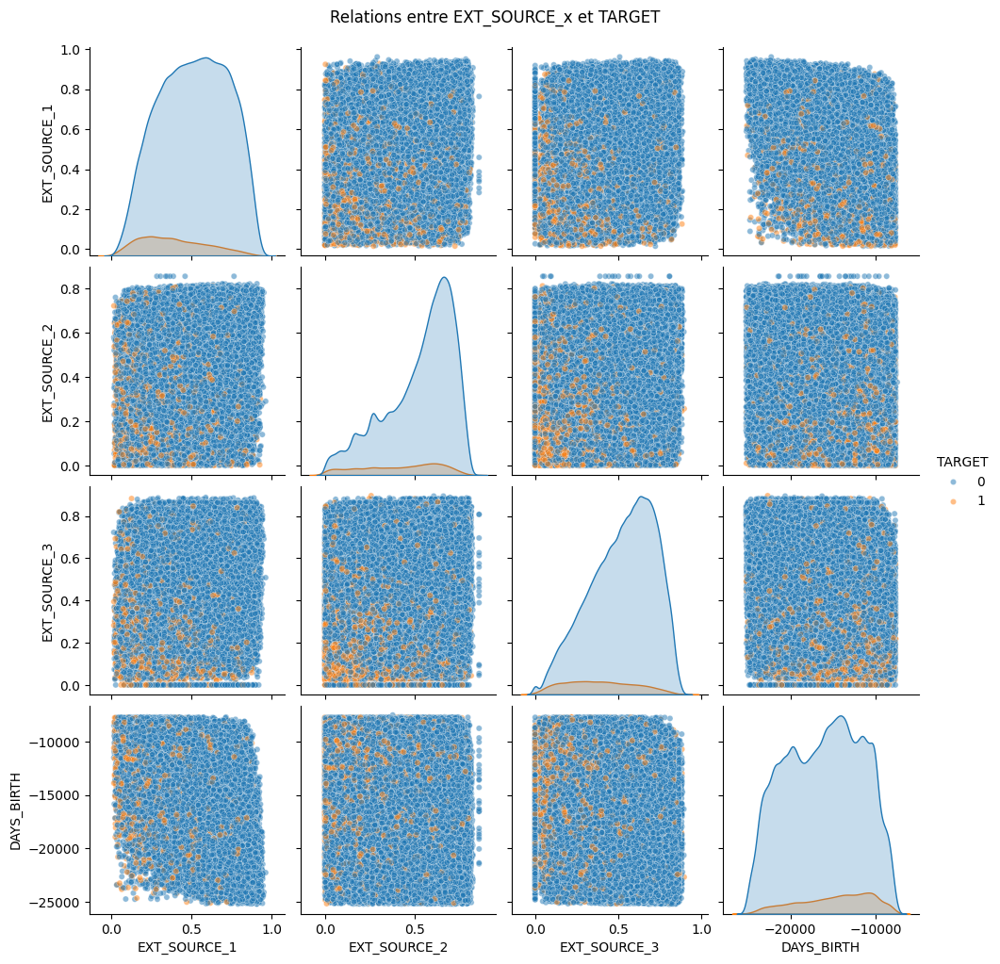

In [38]:
cols = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'TARGET', 'DAYS_BIRTH']
sns.pairplot(app_train[cols], hue='TARGET',
             plot_kws={'alpha':0.5, 's':20})
plt.suptitle('Relations entre EXT_SOURCE_x et TARGET', y=1.02)
plt.show()

* On peut observer par exemple une concentration personnes "jeunes" ayant du mal à rembourser leur prêt avec la source EXT_SOURCE_3

##### Analysons une matrice de corrélation sur les variables les plus correlés à notre cible.

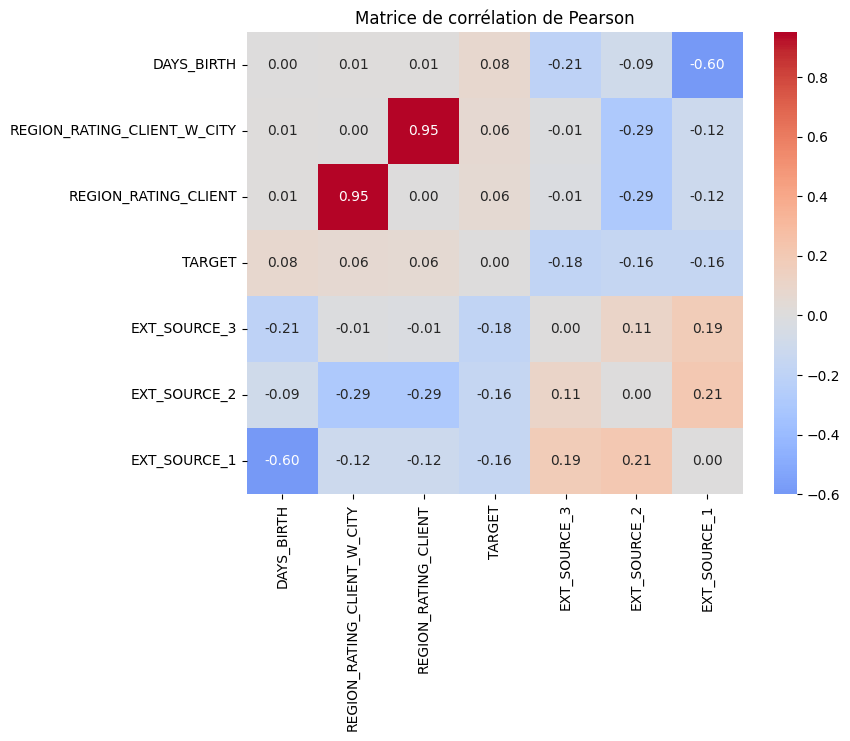

In [39]:
col_num = ['DAYS_BIRTH','REGION_RATING_CLIENT_W_CITY','REGION_RATING_CLIENT','TARGET','EXT_SOURCE_3','EXT_SOURCE_2','EXT_SOURCE_1']
corr_app_train = app_train[col_num]
pearson_corr = corr_app_train.corr(numeric_only=True, method='pearson')
np.fill_diagonal(pearson_corr.values, 0)
plt.figure(figsize=(8, 6))
sns.heatmap(pearson_corr, cmap='coolwarm', center=0, annot=True, fmt=".2f")
plt.title("Matrice de corrélation de Pearson")
plt.show()

* On note une forte relation entre REGION_RATING_CLIENT_W_CITY et REGION_RATING_CLIENT. On pourra donc supprimer REGION_RATING_CLIENT pour garder un détail plus fin par ville. Il faut donc ajouter la suppression de cette colonne dans src/data_cleaning.py

#### 3) Importation du fichier bureau_balance.csv :
* monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.

In [40]:
bureau_balance = pd.read_csv("../data/raw/bureau_balance.csv")

##### Vérification de l'importation

In [41]:
bureau_balance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


##### Nombre de lignes et de colonnes

In [42]:
print(f"Nous avons ici {bureau_balance.shape[0]} lignes et {bureau_balance.shape[1]} colonnes.")

Nous avons ici 27299925 lignes et 3 colonnes.


##### Vérification des doublons
Logiquement il y aura des "doublons" sur la première colonne (ID) car c'est un détail sur plusieurs mois. Le plus important c'est que nous n'avons pas de doublons sur l'ensemble du jeu.

In [43]:
bureau_balance.duplicated(keep = False).any()

np.False_

##### Vérification des valeurs manquantes

In [44]:
missed_val_balance = bureau_balance.isnull().mean()
missed_val_balance

SK_ID_BUREAU      0.0
MONTHS_BALANCE    0.0
STATUS            0.0
dtype: float64

##### Regardons ce que nous avons dans la variable status

In [45]:
bureau_balance['STATUS'].unique()

array(['C', '0', 'X', '1', '2', '3', '5', '4'], dtype=object)

* Cela définit le statut du crédit en cours, si il est ouvert, fermé etc.
* On voit que ce dataframe ne pourra pas être intégré directement avec les autres fichiers, il faudra faire un lien avce bureau avant de l'intégrer avec le dataframe global.
* Sa clé de jointure est SK_ID_BUREAU, à fusionner avec bureau.


#### 4) Importation du fichier bureau.csv :
- data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.

In [46]:
bureau = pd.read_csv("../data/raw/bureau.csv")

##### Vérification de l'importation

In [47]:
show(bureau.head(1000))

Loading ITables v2.5.2 from the internet... (need help?)


##### Nombre de lignes et de colonnes

##### Vérification des doublons

In [48]:
bureau.duplicated(keep = False).any()

np.False_

Logiquement il y aura des "doublons" sur la première colonne (ID) car c'est un détail sur plusieurs mois. Le plus important c'est que nous n'avons pas de doublons sur l'ensemble du jeu.

##### Vérification des valeurs manquantes

In [49]:
missed_val_balance = bureau.isnull().mean()
missed_val_balance

SK_ID_CURR                0.000000
SK_ID_BUREAU              0.000000
CREDIT_ACTIVE             0.000000
CREDIT_CURRENCY           0.000000
DAYS_CREDIT               0.000000
CREDIT_DAY_OVERDUE        0.000000
DAYS_CREDIT_ENDDATE       0.061496
DAYS_ENDDATE_FACT         0.369170
AMT_CREDIT_MAX_OVERDUE    0.655133
CNT_CREDIT_PROLONG        0.000000
AMT_CREDIT_SUM            0.000008
AMT_CREDIT_SUM_DEBT       0.150119
AMT_CREDIT_SUM_LIMIT      0.344774
AMT_CREDIT_SUM_OVERDUE    0.000000
CREDIT_TYPE               0.000000
DAYS_CREDIT_UPDATE        0.000000
AMT_ANNUITY               0.714735
dtype: float64

#### Graphique pour visualiser les valeurs manquantes

<Axes: >

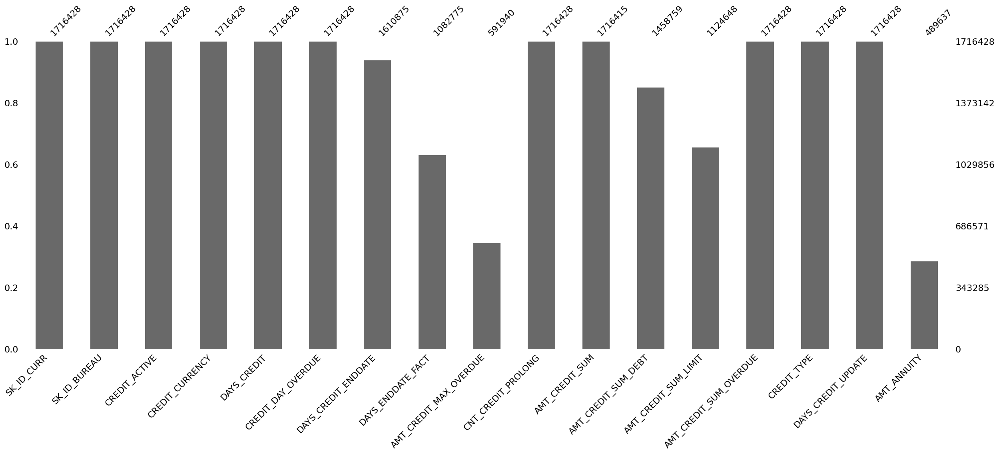

In [50]:
msno.bar(bureau, figsize = (30,10))

* On remarque que la variable AMT_ANNUITY a plus 71% de valeurs manquantes, mais le seuil des 80-90% n'est pas dépassé. On va attendre un peu avant d'agir.

##### Type de données différentes

In [51]:
bureau.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

CREDIT_ACTIVE       4
CREDIT_CURRENCY     4
CREDIT_TYPE        15
dtype: int64

##### Les statistiques descriptives

In [52]:
round(bureau.describe(),2)

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1716428.00,1716428.00,1716428.00,1716428.00,1610875.00,1082775.00,5.919400e+05,1716428.00,1.716415e+06,1.458759e+06,1124648.00,1716428.00,1716428.00,4.896370e+05
mean,278214.93,5924434.49,-1142.11,0.82,510.52,-1017.44,3.825420e+03,0.01,3.549946e+05,1.370851e+05,6229.51,37.91,-593.75,1.571276e+04
std,102938.56,532265.73,795.16,36.54,4994.22,714.01,2.060316e+05,0.10,1.149811e+06,6.774011e+05,45032.03,5937.65,720.75,3.258270e+05
min,100001.00,5000000.00,-2922.00,0.00,-42060.00,-42023.00,0.000000e+00,0.00,0.000000e+00,-4.705600e+06,-586406.12,0.00,-41947.00,0.000000e+00
25%,188866.75,5463953.75,-1666.00,0.00,-1138.00,-1489.00,0.000000e+00,0.00,5.130000e+04,0.000000e+00,0.00,0.00,-908.00,0.000000e+00
50%,278055.00,5926303.50,-987.00,0.00,-330.00,-897.00,0.000000e+00,0.00,1.255185e+05,0.000000e+00,0.00,0.00,-395.00,0.000000e+00
75%,367426.00,6385681.25,-474.00,0.00,474.00,-425.00,0.000000e+00,0.00,3.150000e+05,4.015350e+04,0.00,0.00,-33.00,1.350000e+04
max,456255.00,6843457.00,0.00,2792.00,31199.00,0.00,1.159872e+08,9.00,5.850000e+08,1.701000e+08,4705600.32,3756681.00,372.00,1.184534e+08


* On remarque qu'il y a là aussi un problème sur les jours et il faut transformer en année pour une meilleure visibilité.

* SK_ID_CURR : clé de jointure avec le fichier principal
* SK_IB_BUREAU : pour faire le lien avec le fichier bureau_balance

#### 5) Importation du fichier credit_card_balance.csv :
- monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.

In [53]:
credit_card_balance = pd.read_csv("../data/raw/credit_card_balance.csv")

##### Vérification de l'importation

In [54]:
show(credit_card_balance.head(1000))

Loading ITables v2.5.2 from the internet... (need help?)


##### Nombre de lignes et de colonnes

In [55]:
print(f"Nous avons ici {credit_card_balance.shape[0]} lignes et {credit_card_balance.shape[1]} colonnes.")

Nous avons ici 3840312 lignes et 23 colonnes.


##### Vérification des doublons

In [56]:
credit_card_balance.duplicated(keep = False).any()

np.False_

In [57]:
credit_card_balance.duplicated(['SK_ID_CURR'], keep = False).value_counts()

True     3839620
False        692
Name: count, dtype: int64

* Pas de doublons sur la totalité mais nous retrouvons plusieurs fois les mêmes identifiants, ce qui est normal car nous avons les informations financières par mois.

##### Vérification des valeurs manquantes

In [58]:
missed_val_credit_card = credit_card_balance.isnull().mean()
missed_val_credit_card

SK_ID_PREV                    0.000000
SK_ID_CURR                    0.000000
MONTHS_BALANCE                0.000000
AMT_BALANCE                   0.000000
AMT_CREDIT_LIMIT_ACTUAL       0.000000
AMT_DRAWINGS_ATM_CURRENT      0.195249
AMT_DRAWINGS_CURRENT          0.000000
AMT_DRAWINGS_OTHER_CURRENT    0.195249
AMT_DRAWINGS_POS_CURRENT      0.195249
AMT_INST_MIN_REGULARITY       0.079482
AMT_PAYMENT_CURRENT           0.199981
AMT_PAYMENT_TOTAL_CURRENT     0.000000
AMT_RECEIVABLE_PRINCIPAL      0.000000
AMT_RECIVABLE                 0.000000
AMT_TOTAL_RECEIVABLE          0.000000
CNT_DRAWINGS_ATM_CURRENT      0.195249
CNT_DRAWINGS_CURRENT          0.000000
CNT_DRAWINGS_OTHER_CURRENT    0.195249
CNT_DRAWINGS_POS_CURRENT      0.195249
CNT_INSTALMENT_MATURE_CUM     0.079482
NAME_CONTRACT_STATUS          0.000000
SK_DPD                        0.000000
SK_DPD_DEF                    0.000000
dtype: float64

* Pas de proportion de valeurs manquantes inquiétante pour le moment.

#### Les statistiques descriptives

In [59]:
show(round(credit_card_balance.describe(),2))

Loading ITables v2.5.2 from the internet... (need help?)


#### 6) Importation du fichier HomeCredit_columns_description.csv :
- This file contains descriptions for the columns in the various data files.

In [60]:
homecredit_col_desc = pd.read_csv("../data/raw/HomeCredit_columns_description.csv", encoding="latin1")

Vérification de l'importation

In [61]:
homecredit_col_desc.head()

,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN


#### 7) Importation du fichier installments_payments.csv :
- Payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [62]:
installments_payments = pd.read_csv("../data/raw/installments_payments.csv")

##### Vérification de l'importation

In [63]:
installments_payments.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


##### Nombre de lignes et de colonnes

In [64]:
print(f"Nous avons ici {installments_payments.shape[0]} lignes et {installments_payments.shape[1]} colonnes.")

Nous avons ici 13605401 lignes et 8 colonnes.


##### Vérification des doublons

* Sur la globalité

In [65]:
installments_payments.duplicated(keep=False).any()

np.False_

* Sur les identifiants

In [66]:
installments_payments.duplicated(['SK_ID_PREV'],keep=False).any()

np.True_

##### Vérification des valeurs manquantes

In [67]:
missed_val_intall_pay = installments_payments.isnull().mean()
missed_val_intall_pay

SK_ID_PREV                0.000000
SK_ID_CURR                0.000000
NUM_INSTALMENT_VERSION    0.000000
NUM_INSTALMENT_NUMBER     0.000000
DAYS_INSTALMENT           0.000000
DAYS_ENTRY_PAYMENT        0.000214
AMT_INSTALMENT            0.000000
AMT_PAYMENT               0.000214
dtype: float64

* Peu de valeurs manquantes ici.

In [68]:
round(installments_payments.describe(),2)

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,13605401.00,13605401.00,13605401.00,13605401.00,13605401.00,13602496.00,13605401.00,13602496.00
mean,1903364.97,278444.88,0.86,18.87,-1042.27,-1051.11,17050.91,17238.22
std,536202.91,102718.31,1.04,26.66,800.95,800.59,50570.25,54735.78
min,1000001.00,100001.00,0.00,1.00,-2922.00,-4921.00,0.00,0.00
25%,1434191.00,189639.00,0.00,4.00,-1654.00,-1662.00,4226.08,3398.26
50%,1896520.00,278685.00,1.00,8.00,-818.00,-827.00,8884.08,8125.52
75%,2369094.00,367530.00,1.00,19.00,-361.00,-370.00,16710.21,16108.42
max,2843499.00,456255.00,178.00,277.00,-1.00,-1.00,3771487.84,3771487.84


#### 8) Importation du fichier POS_CASH_balance.csv :
- Monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.

In [69]:
cash_balance = pd.read_csv("../data/raw/POS_CASH_balance.csv")

##### Vérification de l'importation

In [70]:
cash_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


##### Nombre de lignes et de colonnes

In [71]:
print(f"Nous avons ici {cash_balance.shape[0]} lignes et {cash_balance.shape[1]} colonnes.")

Nous avons ici 10001358 lignes et 8 colonnes.


##### Vérification des doublons

In [72]:
cash_balance.duplicated(keep=False).any()

np.False_

In [73]:
cash_balance.duplicated(['SK_ID_CURR'],keep=False).value_counts()

True     10000986
False         372
Name: count, dtype: int64

##### Vérification des valeurs manquantes

In [74]:
missed_val_cash_balance = cash_balance.isnull().mean()
missed_val_cash_balance

SK_ID_PREV               0.000000
SK_ID_CURR               0.000000
MONTHS_BALANCE           0.000000
CNT_INSTALMENT           0.002607
CNT_INSTALMENT_FUTURE    0.002608
NAME_CONTRACT_STATUS     0.000000
SK_DPD                   0.000000
SK_DPD_DEF               0.000000
dtype: float64

* Peu de valeurs manquantes

##### Les valeurs statistiques

In [75]:
round(cash_balance.describe(),2)

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,SK_DPD,SK_DPD_DEF
count,10001358.00,10001358.00,10001358.00,9975287.00,9975271.00,10001358.00,10001358.00
mean,1903216.60,278403.86,-35.01,17.09,10.48,11.61,0.65
std,535846.53,102763.75,26.07,12.00,11.11,132.71,32.76
min,1000001.00,100001.00,-96.00,1.00,0.00,0.00,0.00
25%,1434405.00,189550.00,-54.00,10.00,3.00,0.00,0.00
50%,1896565.00,278654.00,-28.00,12.00,7.00,0.00,0.00
75%,2368963.00,367429.00,-13.00,24.00,14.00,0.00,0.00
max,2843499.00,456255.00,-1.00,92.00,85.00,4231.00,3595.00


#### 9) Importation du fichier previous_application.csv :
- previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.

In [76]:
previous_application = pd.read_csv("../data/raw/previous_application.csv")

Vérification de l'importation

In [77]:
show(previous_application.head(1000))

Loading ITables v2.5.2 from the internet... (need help?)


##### Nombre de lignes et de colonnes

In [78]:
print(f"Nous avons ici {previous_application.shape[0]} lignes et {previous_application.shape[1]} colonnes.")

Nous avons ici 1670214 lignes et 37 colonnes.


##### Vérification des doublons

In [79]:
previous_application.duplicated(keep=False).any()

np.False_

In [80]:
previous_application.duplicated(['SK_ID_CURR'],keep=False).any()

np.True_

* On retrouve plusieurs fois les mêmes identifiants.

##### Vérification des valeurs manquantes

In [81]:
missed_val_previous_application = previous_application.isnull().mean()
missed_val_previous_application = missed_val_previous_application[missed_val_previous_application > 0].count()
print(f"Nous avons {missed_val_previous_application} colonnes avec des valeurs manquantes.")

Nous avons 16 colonnes avec des valeurs manquantes.


In [82]:
missed_val_previous_application = previous_application.isnull().mean()
missed_val_previous_application = missed_val_previous_application[missed_val_previous_application >= 0.60]
missed_val_previous_application

RATE_INTEREST_PRIMARY       0.996437
RATE_INTEREST_PRIVILEGED    0.996437
dtype: float64

* Il faudra supprimer les deux colonnes suivantes : RATE_INTEREST_PRIMARY / RATE_INTEREST_PRIVILEGED car nous avons plus de 99% de valeurs manquantes. Nous ajouterons cette lignes pour le traitement du fichier previous_application dans le feature_aggregation.py

#### Importation du fichier sample_submission.csv

In [83]:
sample_submission = pd.read_csv("../data/raw/sample_submission.csv")

Vérification de l'importation

In [84]:
sample_submission.head()

,SK_ID_CURR,TARGET
0,100001,0.5
1,100005,0.5
2,100013,0.5
3,100028,0.5
4,100038,0.5
